# Decision Tree Regression With Hyper Parameter Tuning

https://www.nbshare.io/notebook/312837011/Decision-Tree-Regression-With-Hyper-Parameter-Tuning-In-Python/

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [16]:
data = pd.read_csv("../Datasets/Real_Combine.csv")
data.dropna(inplace=True)

- T == Average Temperature (°C)
- TM == Maximum temperature (°C)
- Tm == Minimum temperature (°C)
- SLP == Atmospheric pressure at sea level (hPa)
- H == Average relative humidity (%)
- VV == Average visibility (Km)
- V == Average wind speed (Km/h)
- VM == Maximum sustained wind speed (Km/h)
- PM2.5== Fine particulate matter (PM2.5) is an air pollutant that is a concern for people's health when levels in air are high

<AxesSubplot:>

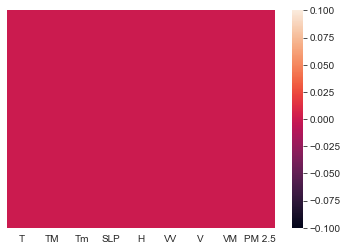

In [17]:
import seaborn as sns
sns.heatmap(data.isnull(),yticklabels=False)

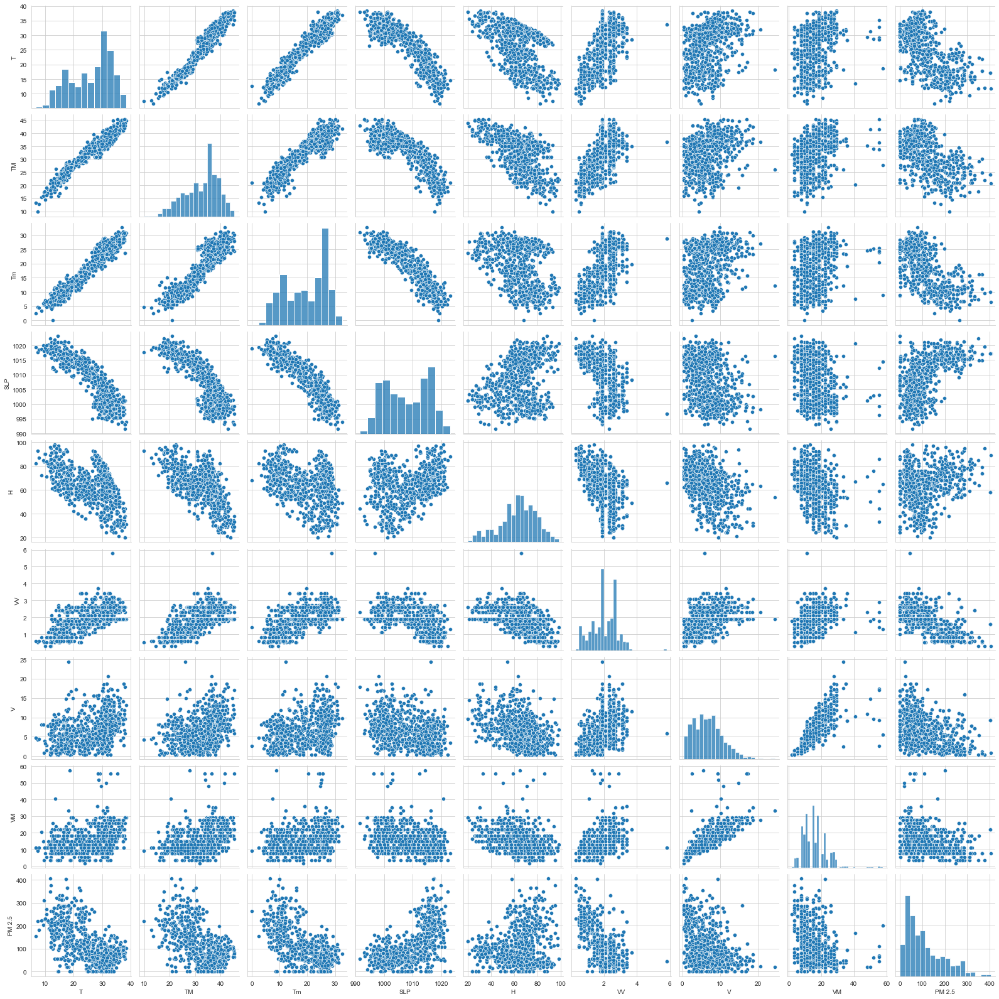

In [18]:
sns.pairplot(data)

In [19]:
data.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


## Feature selection

In [20]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as acc

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
    data.iloc[:,:-1],
    data.iloc[:,-1],
    test_size=0.3,
    random_state=0)

<AxesSubplot:>

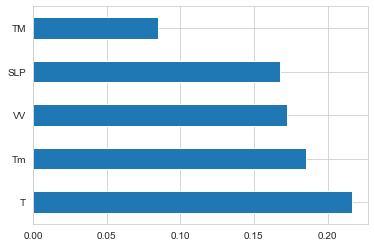

In [22]:
reg = ExtraTreesRegressor()
reg.fit(X_train, y_train)

feat_importance = pd.Series(reg.feature_importances_, index=X_train.columns)
feat_importance.nlargest().plot(kind='barh')

In [23]:
from sklearn.tree import DecisionTreeRegressor
reg_decision_model = DecisionTreeRegressor()

reg_decision_model.fit(X_train, y_train)
reg_decision_model.score(X_test, y_test)

0.6727364788285235

In [25]:
# Tuning of model

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0, 0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

from sklearn.model_selection import GridSearchCV

tuning_model=GridSearchCV(DecisionTreeRegressor(),param_grid=parameters,scoring='neg_mean_squared_error',verbose=3)
tuning_model.fit(X_train, y_train)

Fitting 5 folds for each of 11200 candidates, totalling 56000 fits
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0, splitter=best;, score=-3512.564 total time=   0.0s
[CV 2/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0, splitter=best;, score=-3781.041 total time=   0.0s
[CV 3/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0, splitter=best;, score=-3784.250 total time=   0.0s
[CV 4/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0, splitter=best;, score=-3336.309 total time=   0.0s
[CV 5/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0, splitter=best;, score=-4123.385 total time=   0.0s
[CV 1/5] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_le

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11, 12],
                         'max_features': ['auto', 'log2', 'sqrt', None],
                         'max_leaf_nodes': [None, 10, 20, 30, 40, 50, 60, 70,
                                            80, 90],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'min_weight_fraction_leaf': [0, 0.5],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error', verbose=3)

In [26]:
print(tuning_model.best_params_, tuning_model.best_score_)

{'max_depth': 12, 'max_features': 'auto', 'max_leaf_nodes': 70, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'random'} -2187.7856868322865


In [27]:
tuning_model.best_estimator_.score(X_test, y_test)

0.5958712784288231